In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

In [2]:
from os import listdir
from os.path import isfile, join
import imutils


image = 1
mypath = '../data/imagesprojets5/photo/'
onlyfiles = [f for f in listdir(mypath) if isfile(join(mypath, f))]

In [3]:
onlyfiles

['image_1_1.jpg',
 'image_1_2.jpg',
 'image_1_3.jpg',
 'image_2_1.jpg',
 'image_2_2.jpg',
 'image_2_3.jpg',
 'image_2_4.jpg',
 'image_2_5.jpg',
 'image_3_1.jpg']

In [4]:
img_file = onlyfiles[4]
origin_file = '../data/imagesprojets5/originals/image_1.jpg' 

In [5]:
img = cv2.imread(mypath + img_file)
origin = cv2.imread(origin_file)

In [6]:
img.shape

(2583, 1875, 3)

Text(0.5, 1.0, 'origin image')

<Figure size 720x720 with 0 Axes>

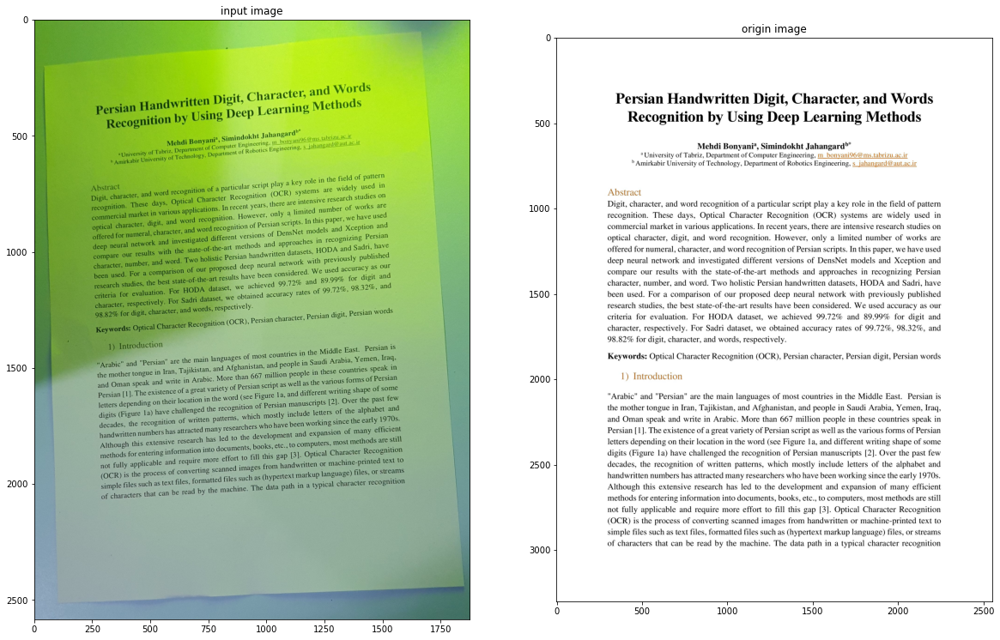

In [7]:
plt.figure(figsize=(10,10))
plt.rcParams["figure.figsize"] = [20,20]

fig, (ax1, ax2) = plt.subplots(1, 2)

ax1.imshow(img)
ax1.set_title('input image')
ax2.imshow(origin)
ax2.set_title('origin image')

In [8]:
rotate = False
angle = 180
if rotate or img.shape[1]>img.shape[0]:
    img = imutils.rotate_bound(img, angle)

Text(0.5, 1.0, 'origin image')

<Figure size 720x720 with 0 Axes>

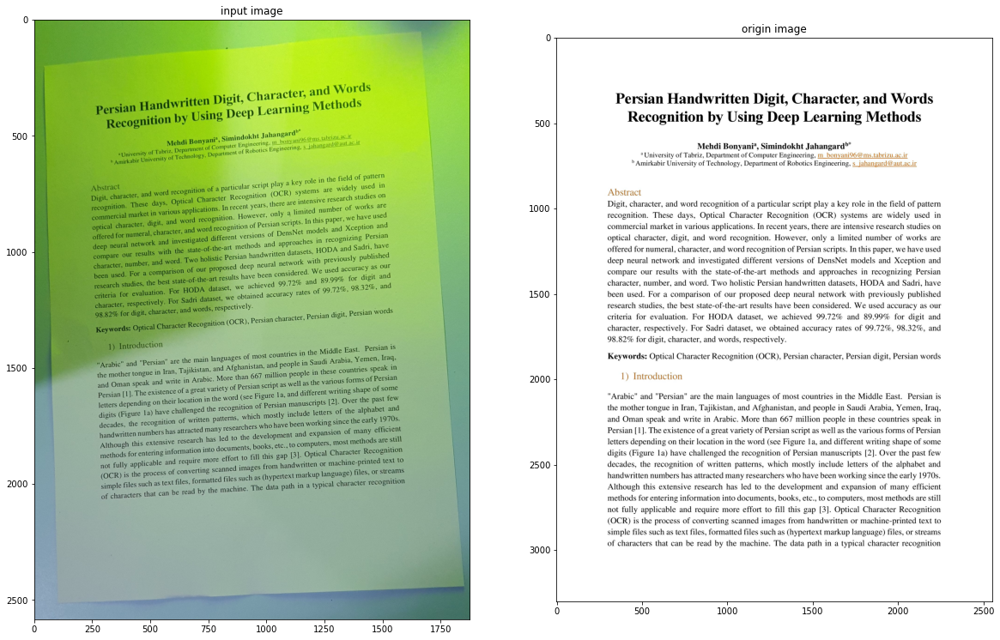

In [9]:
plt.figure(figsize=(10,10))
plt.rcParams["figure.figsize"] = [20,20]

fig, (ax1, ax2) = plt.subplots(1, 2)

ax1.imshow(img)
ax1.set_title('input image')
ax2.imshow(origin)
ax2.set_title('origin image')

In [10]:
# paper = img.copy()
    
# gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)


# ret, thresh_gray = cv2.threshold(cv2.cvtColor(paper, cv2.COLOR_BGR2GRAY),
#                         200, 255, cv2.THRESH_BINARY)

# thresh_gray = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]


# image, contours = cv2.findContours(thresh_gray, cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_NONE)
# for c in contours:
#     rect = cv2.minAreaRect(c)
#     box = cv2.boxPoints(rect)
#     # convert all coordinates floating point values to int
#     box = np.int0(box)
#     # draw a green 'nghien' rectangle
#     cv2.drawContours(paper, [box], 0, (0, 255, 0),1)
# plt.imshow(paper)



In [11]:

# import imutils

# image = img.copy()
# ratio = image.shape[0] / 500.0
# orig = image.copy()
# image = imutils.resize(image, height = 500)
# # convert the image to grayscale, blur it, and find edges
# # in the image
# gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
# gray = cv2.GaussianBlur(gray, (5, 5), 0)
# edged = cv2.Canny(gray, 75, 200)


# cnts = cv2.findContours(edged.copy(), cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
# cnts = imutils.grab_contours(cnts)
# cnts = sorted(cnts, key = cv2.contourArea, reverse = True)[:5]
# # loop over the contours
# for c in cnts:
#     # approximate the contour
#     peri = cv2.arcLength(c, True)
#     approx = cv2.approxPolyDP(c, 0.02 * peri, True)
#     # if our approximated contour has four points, then we
#     # can assume that we have found our screen
#     if len(approx) >= 4:
#         screenCnt = approx
#         break

# cv2.drawContours(image, [screenCnt], -1, (0, 255, 0), 2)



## Remove Shadows

Text(0.5, 1.0, 'result_norm_planes')

<Figure size 720x720 with 0 Axes>

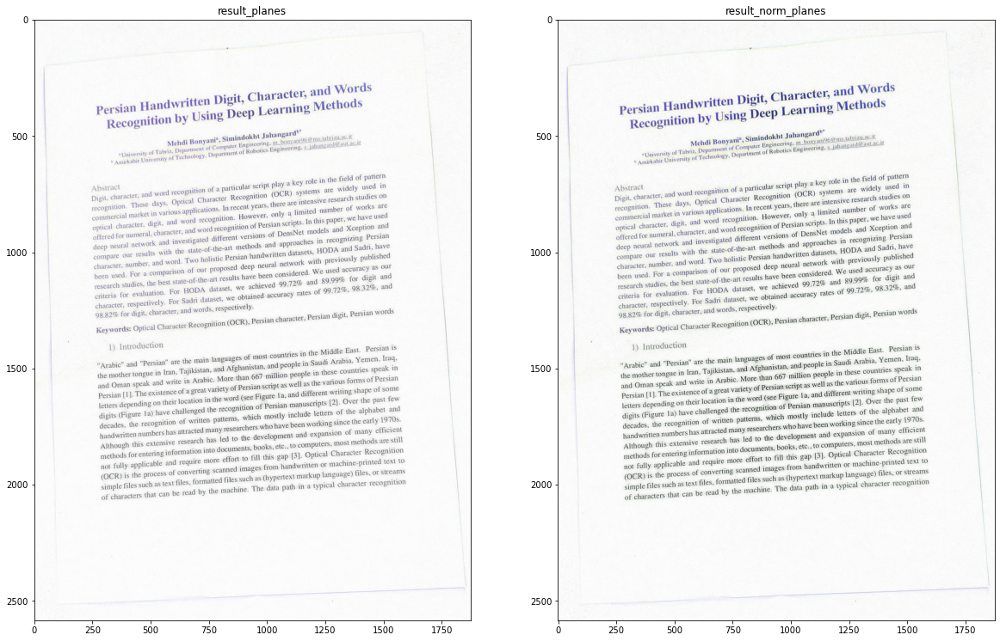

In [12]:

rgb_planes = cv2.split(img)

result_planes = []
result_norm_planes = []
for plane in rgb_planes:
    dilated_img = cv2.dilate(plane, np.ones((7,7), np.uint8))
    bg_img = cv2.medianBlur(dilated_img, 21)
    diff_img = 255 - cv2.absdiff(plane, bg_img)
    norm_img = cv2.normalize(diff_img,None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8UC1)
    result_planes.append(diff_img)
    result_norm_planes.append(norm_img)

result = cv2.merge(result_planes)
result_norm = cv2.merge(result_norm_planes)

plt.figure(figsize=(10,10))
plt.rcParams["figure.figsize"] = [20,20]

fig, (ax1, ax2) = plt.subplots(1, 2)

ax1.imshow(result)
ax1.set_title('result_planes')
ax2.imshow(result_norm)
ax2.set_title('result_norm_planes')

In [13]:
img = result_norm.copy()

## Rescale the image 

In [14]:
origin_unresized = origin.copy()
scale_percent = 40
width = int(img.shape[1]*scale_percent/100)
height = int(img.shape[0]*scale_percent/100)
dim = (width, height)

img = cv2.resize(img,dim, interpolation = cv2.INTER_AREA)
origin = cv2.resize(origin,dim, interpolation = cv2.INTER_AREA)

Text(0.5, 1.0, 'origin image')

<Figure size 720x720 with 0 Axes>

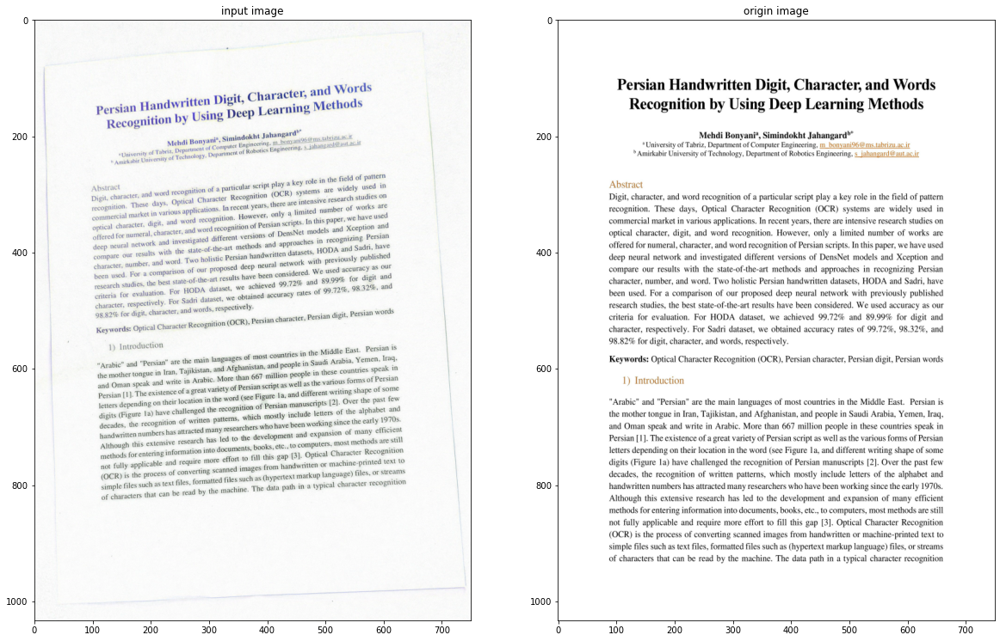

In [15]:
plt.figure(figsize=(10,10))
plt.rcParams["figure.figsize"] = [20,20]

fig, (ax1, ax2) = plt.subplots(1, 2)

ax1.imshow(img)
ax1.set_title('input image')
ax2.imshow(origin)
ax2.set_title('origin image')

## Use Sifts to Align the image with the original image

In [16]:
## FIX
orb = cv2.ORB_create()

# find the keypoints with ORB
kp1 = orb.detect(img,None)

# compute the descriptors with ORB
kp1, des1 = orb.compute(img, kp1)

kp2 = orb.detect(origin,None)
kp2, des2 = orb.compute(origin, kp2)

# create BFMatcher object
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)

# Match descriptors.
matches = bf.match(des1,des2)


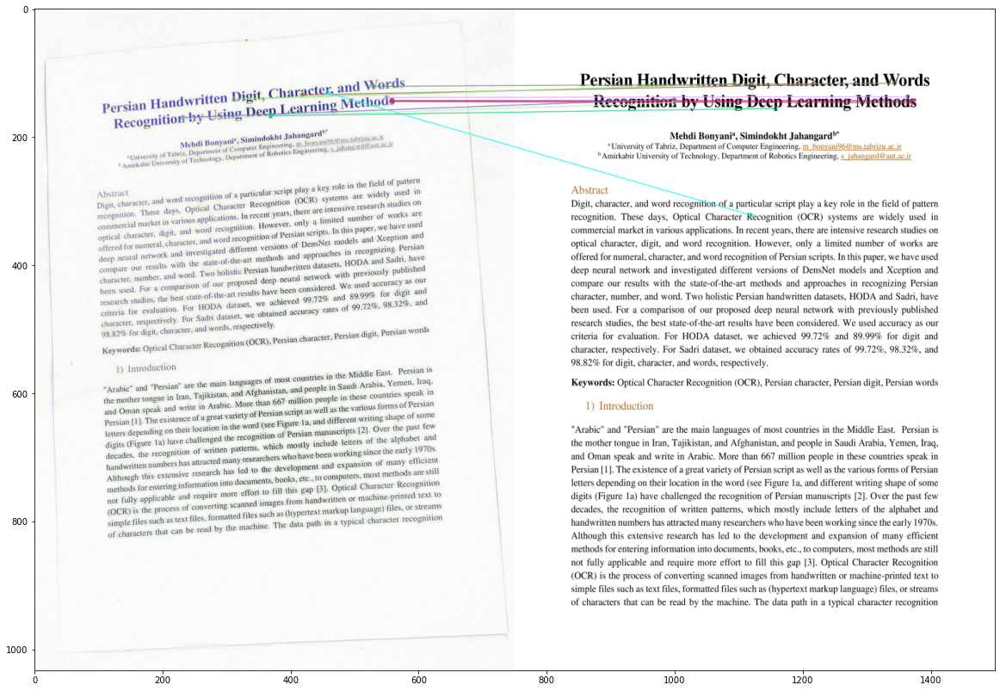

(<matplotlib.image.AxesImage at 0x1b5641e2d00>, None)

In [17]:
# Sort them in the order of their distance.
matches = sorted(matches, key = lambda x:x.distance)

# Draw first 10 matches.
img3 = cv2.drawMatches(img,kp1,origin,kp2,matches[:10],None, flags=2)

plt.imshow(img3),plt.show()

In [20]:
src=[]
dest=[]
for match in matches[:100]:
    kp_img1=kp1[match.queryIdx]
    kp_img2=kp2[match.trainIdx]
    src.append((kp_img1.pt[0],kp_img1.pt[1]))
    dest.append((kp_img2.pt[0],kp_img2.pt[1])) 

In [21]:
h, status = cv2.findHomography(np.array(src), np.array(dest),cv2.RANSAC, 5.0)
print(h)

[[ 1.23669649e+00  1.23177424e-02 -2.53080832e+01]
 [ 1.28122665e-01  1.39216876e+00 -1.14741631e+02]
 [ 6.16918846e-05  2.52984206e-04  1.00000000e+00]]


In [25]:
im_out = cv2.warpPerspective(img,h,(origin.shape[1], origin.shape[0]))

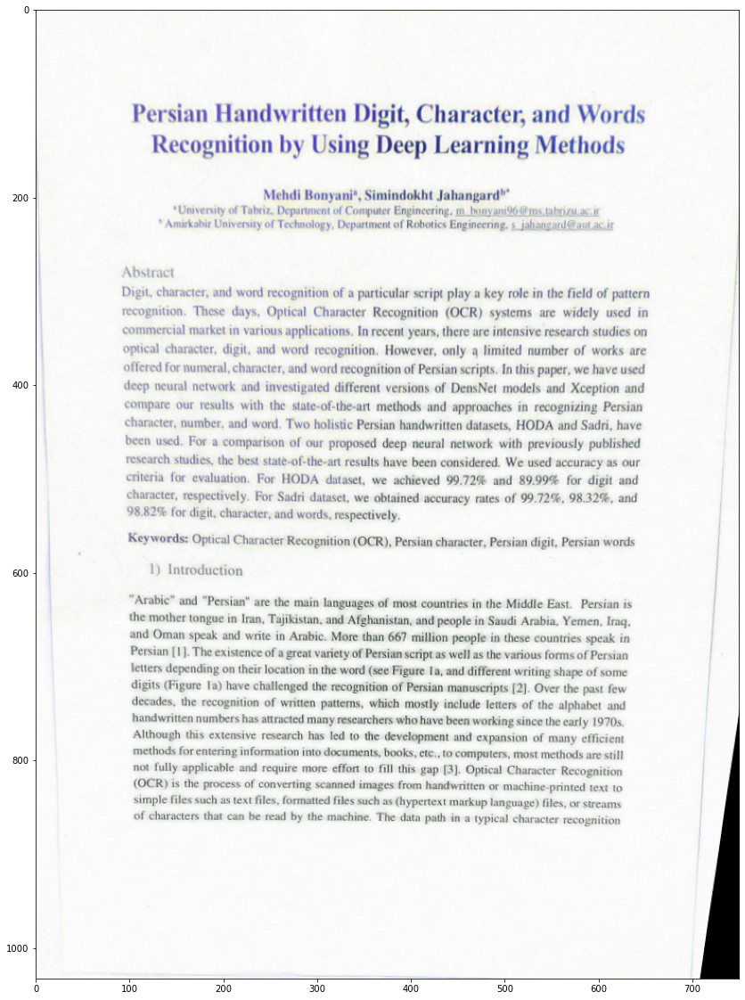

(<matplotlib.image.AxesImage at 0x16f97f307f0>, None)

In [26]:
plt.imshow(im_out),plt.show()

In [30]:
y_min,y_max,x_min,x_max = (350, 2247, 312, 1830)

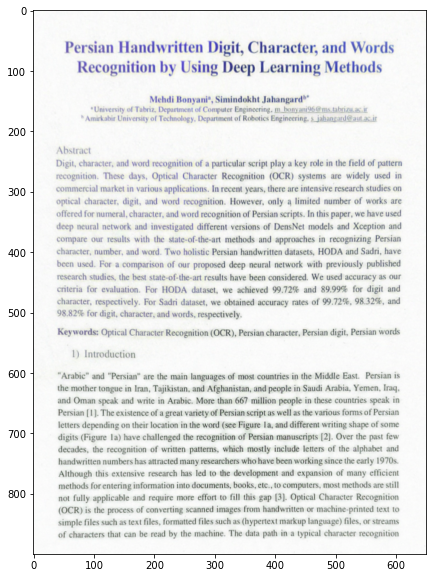

In [41]:
margin = 100
im_out_cropped = im_out[50:950,50:700]
plt.figure(figsize=(15,10))
plt.imshow(im_out_cropped)


In [22]:
im_out = cv2.resize(im_out,(origin_unresized.shape[1],origin_unresized.shape[0]), interpolation = cv2.INTER_AREA)

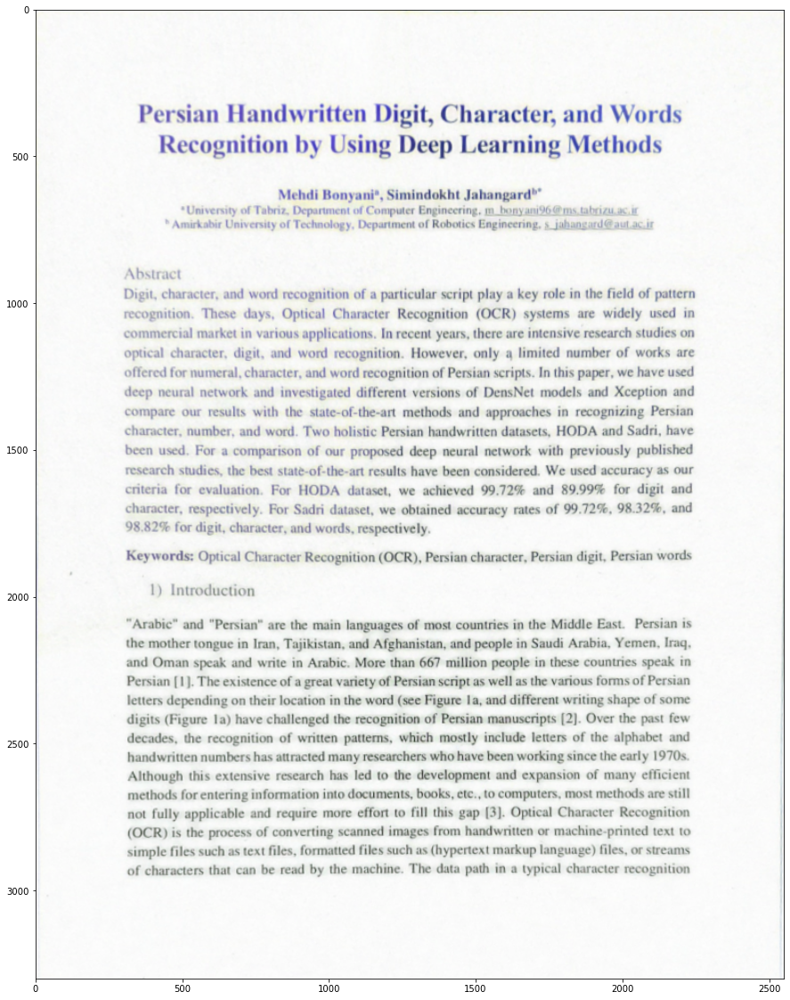

(<matplotlib.image.AxesImage at 0x1b56603ec10>, None)

In [23]:
plt.imshow(im_out),plt.show()

In [199]:
im_out_gray = cv2.cvtColor(im_out, cv2.COLOR_BGR2GRAY)

## Using OpenCV FindContours

In [201]:
def detect_lines(img):
    """
    Returns lines in a text image, uses opencv to first apply a morphology then findContours to detect the contours of a text.
    Uses the following algorithm for contour detection : 
    Suzuki, S. and Abe, K., Topological Structural Analysis of Digitized Binary Images by Border Following. CVGIP 30 1, pp 32-46 (1985)
    """
    # convert to gray
    if len(img.shape) == 3:
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    else : 
        gray = img.copy()
    # threshold the grayscale image
    
    thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]

    # use morphology erode to blur horizontally
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (151, 3))
    morph = cv2.morphologyEx(thresh, cv2.MORPH_DILATE, kernel)
    
    # find contours
    cntrs = cv2.findContours(morph, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cntrs = cntrs[0] if len(cntrs) == 2 else cntrs[1]

    # find the topmost box
    ythresh = 1000000
    for c in cntrs:
        box = cv2.boundingRect(c)
        x,y,w,h = box
        if y < ythresh:
            topbox = box
            ythresh = y

    # Draw contours excluding the topmost box
    result = img.copy()
    for c in cntrs:
        box = cv2.boundingRect(c)
        if box != topbox:
            x,y,w,h = box
            cv2.rectangle(result, (x, y), (x+w, y+h), (0, 0, 255), 2)
    return cntrs,result,morph,thresh

In [202]:
cntrs,result,morph,thresh = detect_lines(im_out_gray)

Text(0.5, 1.0, 'thresh image')

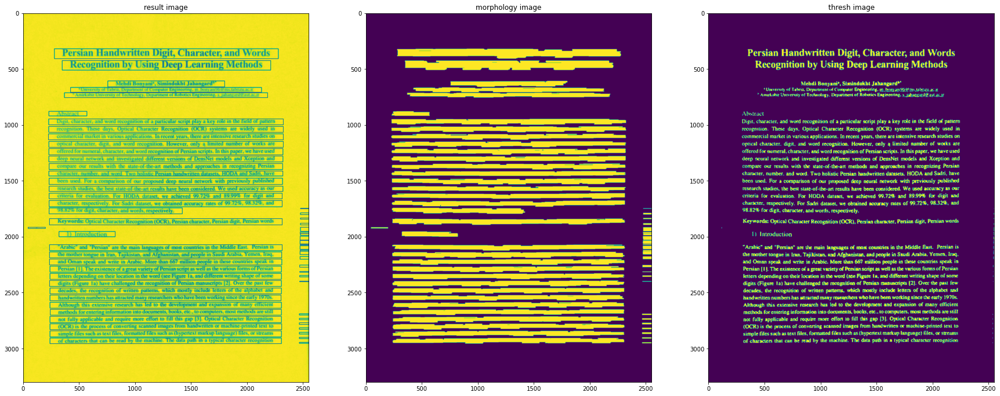

In [203]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3)
plt.rcParams["figure.figsize"] = [30,20]

ax1.imshow(result)
ax1.set_title('result image')

ax2.imshow(morph)
ax2.set_title('morphology image')


ax3.imshow(thresh)
ax3.set_title('thresh image')

## Using Pytesseract (OCR)

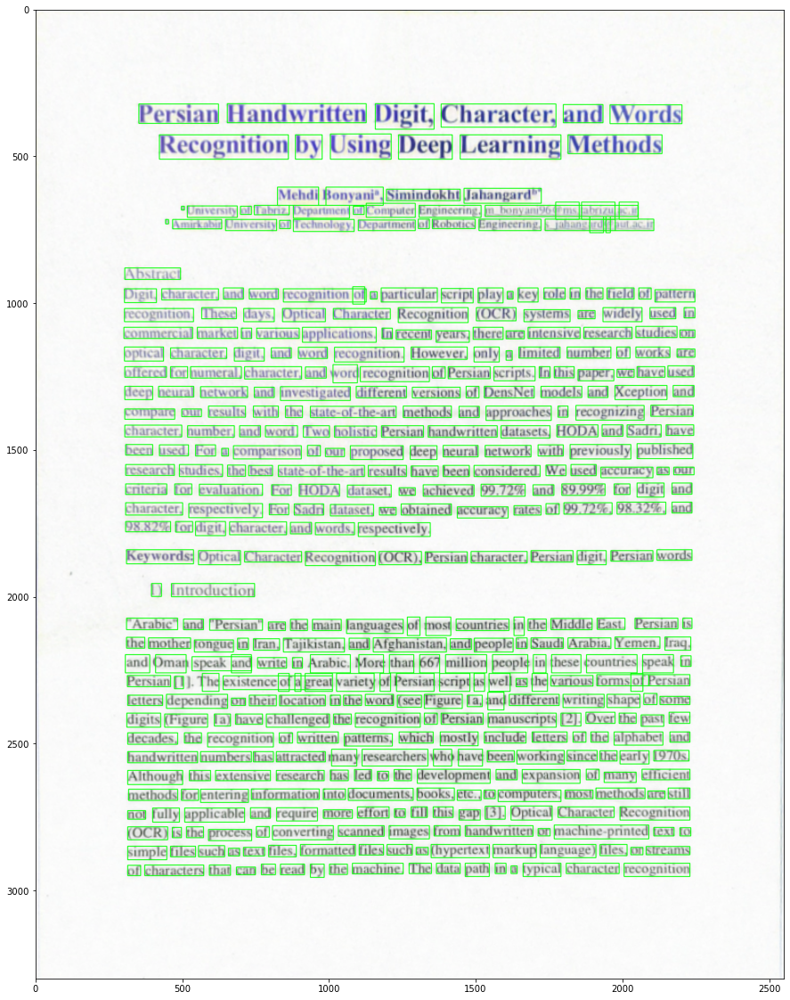

In [204]:
import pytesseract

plt.rcParams["figure.figsize"] = [30,20]

im_tesseract = im_out.copy()
d = pytesseract.image_to_data(im_tesseract, output_type=pytesseract.Output.DICT)
n_boxes = len(d['level'])
level = 5
words_coords = []
for i in range(n_boxes):
    if d['level'][i] == level:
        word = {}
        (x, y, w, h) = (d['left'][i], d['top'][i], d['width'][i], d['height'][i])
        word['x'] = x
        word['y'] = y
        word['w'] = w
        word['h'] = h
        word['text'] = d['text'][i]
        words_coords.append(word)
        cv2.rectangle(im_tesseract, (x, y), (x + w, y + h), (0, 255, 0), 2)
plt.imshow(im_tesseract)

In [205]:
i = 240
x1,y1,w1,h1 = list(words_coords[i].values())[:-1]
x2,y2,w2,h2 = list(words_coords[i+1].values())[:-1]

Text(0.5, 1.0, 'word : Middle')

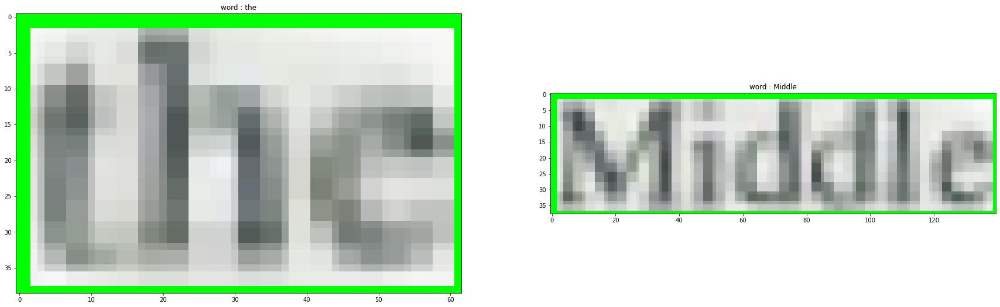

In [206]:
fig, (ax1, ax2) = plt.subplots(1, 2)
plt.rcParams["figure.figsize"] = [10,5]

ax1.imshow(im_tesseract[y1:y1+h1,x1:x1+w1])
ax1.set_title(f'word : {words_coords[i]["text"]}')

ax2.imshow(im_tesseract[y2:y2+h2,x2:x2+w2])
ax2.set_title(f'word : {words_coords[i+1]["text"]}')


In [227]:
x1,w1,x1+w1

(1676, 62, 1738)

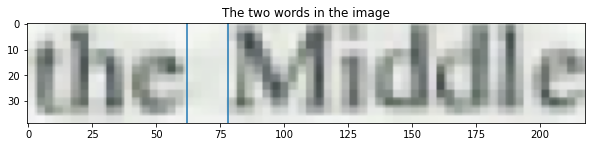

In [231]:
fig, (ax1) = plt.subplots(1)
plt.rcParams["figure.figsize"] = [10,5]

ax1.imshow(im_out[y1:y1+h1,x1:x2+w2])
ax1.set_title('The two words in the image')
plt.axvline(x=w1)
plt.axvline(x=x2-x1)

In [208]:
distance = x2 - (x1 + w1)
print(f'distance between the two words "{words_coords[i]["text"]}" and "{words_coords[i+1]["text"]}" is : {distance} pixels')

distance between the two words "the" and "Middle" is : 16 pixels


Text(0.5, 1.0, 'The two words in the original image')

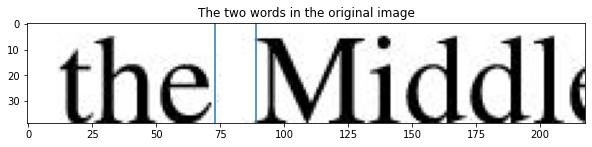

In [236]:
fig, (ax1) = plt.subplots(1)
plt.rcParams["figure.figsize"] = [10,5]

ax1.imshow(origin_unresized[y1:y1+h1,x1:x2+w2])
plt.axvline(x=73)
plt.axvline(x=73+distance)
ax1.set_title('The two words in the original image')